# Mathematical Morphology Analysis

In [84]:
import numpy as np
import platform
import tempfile
import os
import matplotlib.pyplot as plt
from scipy import ndimage as ndi
from skimage import io as skio
from skimage.color import rgb2gray
import skimage.morphology as morpho
from skimage.segmentation import watershed
from skimage.draw import line
import skimage.feature as skf
from scipy import ndimage as ndi

## 2. Basic Morphological Operations

In [73]:
def viewimage(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI et MAXI seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' '
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'
    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M

    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.png')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def viewimage_color(im,normalise=True,MINI=0.0, MAXI=255.0):
    """ Cette fonction fait afficher l'image EN NIVEAUX DE GRIS
        dans gimp. Si un gimp est deja ouvert il est utilise.
        Par defaut normalise=True. Et dans ce cas l'image est normalisee
        entre 0 et 255 avant d'être sauvegardee.
        Si normalise=False MINI(defaut 0) et MAXI (defaut 255) seront mis a 0 et 255 dans l'image resultat

    """
    imt=np.float32(im.copy())
    if platform.system()=='Darwin': #on est sous mac
        prephrase='open -a GIMP '
        endphrase=' '
    elif platform.system()=='Linux': #SINON ON SUPPOSE LINUX (si vous avez un windows je ne sais comment faire. Si vous savez dites-moi.)
        prephrase='gimp '
        endphrase= ' &'
    elif platform.system()=='Windows':
        prephrase='start /B "D:/GIMP/bin/gimp-2.10.exe" -a '#Remplacer D:/... par le chemin de votre GIMP
        endphrase= ''
    else:
        print('Systeme non pris en charge par l affichage GIMP')
        return 'erreur d afficahge'

    if normalise:
        m=imt.min()
        imt=imt-m
        M=imt.max()
        if M>0:
            imt=imt/M
    else:
        imt=(imt-MINI)/(MAXI-MINI)
        imt[imt<0]=0
        imt[imt>1]=1

    nomfichier=tempfile.mktemp('TPIMA.pgm')
    commande=prephrase +nomfichier+endphrase
    skio.imsave(nomfichier,imt)
    os.system(commande)


def strel(forme,taille,angle=45):
    """renvoie un element structurant de forme
     'diamond'  boule de la norme 1 fermee de rayon taille
     'disk'     boule de la norme 2 fermee de rayon taille
     'square'   carre de cote taille (il vaut mieux utiliser taille=impair)
     'line'     segment de langueur taille et d'orientation angle (entre 0 et 180 en degres)
      (Cette fonction n'est pas standard dans python)
    """

    if forme == 'diamond':
        return morpho.diamond(taille)
    if forme == 'disk':
        return morpho.disk(taille)
    if forme == 'square':
        return morpho.square(taille)
    if forme == 'line':
        angle=int(-np.round(angle))
        angle=angle%180
        angle=np.float32(angle)/180.0*np.pi
        x=int(np.round(np.cos(angle)*taille))
        y=int(np.round(np.sin(angle)*taille))
        if x**2+y**2 == 0:
            if abs(np.cos(angle))>abs(np.sin(angle)):
                x=int(np.sign(np.cos(angle)))
                y=0
            else:
                y=int(np.sign(np.sin(angle)))
                x=0
        rr,cc=line(0,0,y,x)
        rr=rr-rr.min()
        cc=cc-cc.min()
        img=np.zeros((rr.max()+1,cc.max()+1) )
        img[rr,cc]=1
        return img
    raise RuntimeError('Erreur dans fonction strel: forme incomprise')



def couleurs_alea(im):
    """
    Donne des couleurs aleatoires a une image en niveau de gris.
    Cette fonction est utile lorsque le niveua de gris d'interprete comme un numero
      de region. Ou encore pour voir les leger degrades d'une teinte de gris.
      """
    sh=im.shape
    out=np.zeros((sh[0],sh[1],3),dtype=np.uint8)
    nbcoul=np.int32(im.max())
    tabcoul=np.random.randint(0,256,size=(nbcoul+1,3))
    tabcoul[0,:]=0
    for k in range(sh[0]):
        for l in range(sh[1]):
            out[k,l,:]=tabcoul[im[k,l]]
    return out

def gris_depuis_couleur(im):
    """ Transforme une image couleur en image a niveaux de gris"""
    return im[:,:,:3].sum(axis=2)/3

## 3. Top-Hat Transform

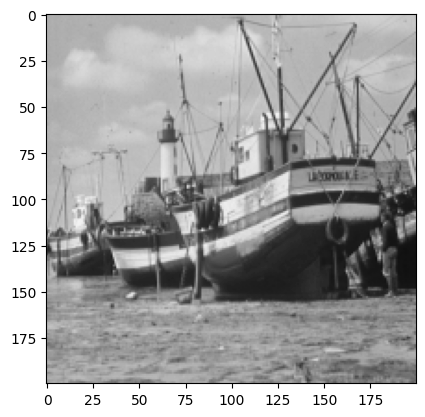

In [58]:
im=skio.imread('bat200.bmp')
im=gris_depuis_couleur(im)
plt.imshow(im,cmap="gray",vmin=0, vmax=255)


Applying the opening operation with different structuring elements we get different results. In particular we can see how, changing only among diamond, square, disk and line, the whole final result changes. The opening in fact is an operation in mathematical morphology that involves an erosion followed by a dilation and its effect depend heavily on the shape of the structuring element.

###Diamond###
The diamond structuring element results in an erosion that removes small protrusions or bright regions in the image with a "diamond pattern". The sharp edges are hence more uniformly reduced compared to other SE shapes, but the effect is slightly directional due to the way the diamond shape works, which favors diagonals. This approach generally smooths out regions with sharp corners, as the diagonals are more affected.

###Square###
The square shape tends instead to remove small details in all directions equally but the result can be blocky due to the shape of the structuring element.  Sharp edges and corners are in this case smoothed out, but square-like artifacts moght appear in the image because of the rectangular dilation. In this way we are preserving horizontal and vertical lines better but can distort diagonal structures more than round shapes.

###Disk###
The disk shape has a strong smoothing effect, as we can see from the image, because it evenly affect pixels in all directions. This means that small details and noise are smoothed out over a large area, leading to a more *blurred* appearance. The disk removes finer details more aggressively compared to other shapes like the diamond or square. Since the disk is round, its smoothing effect tends to soften edges and round off corners. On the flip side, circular or curved features in the image are better preserved compared to straight lines, as the disk naturally complements such shapes.

###Line###
The line SE is highly directional, which means it will strongly favor either horizontal or vertical features, depending on its orientation.

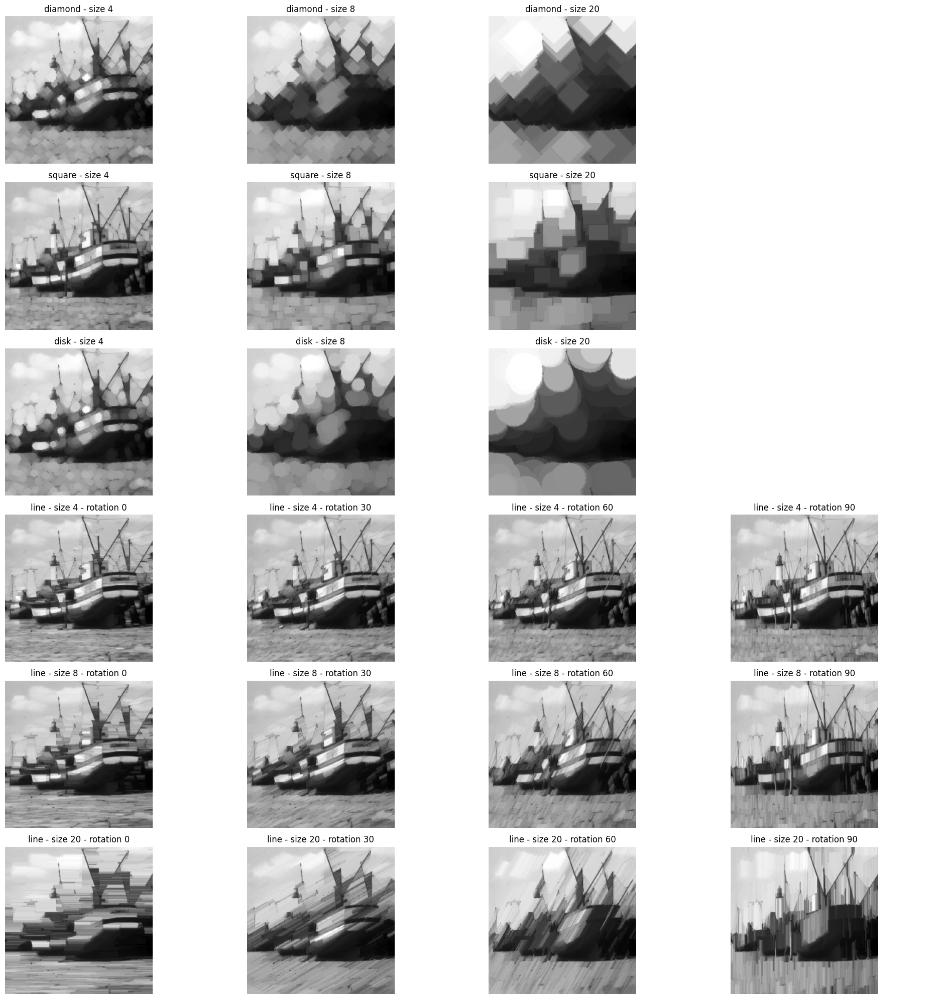

In [59]:
##angelo
#opening

# Define the subplot layout
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

# Define structuring element sizes
size_SE = {0: 4, 1: 8, 2: 20}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

# Define shapes
shapes = ['diamond', 'square', 'disk', 'line']

# Initialize dictionaries to hold structuring elements and plots
se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.opening(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the opening operation and store the result
      result = morpho.opening(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')  # Turn off axis for better visualization

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



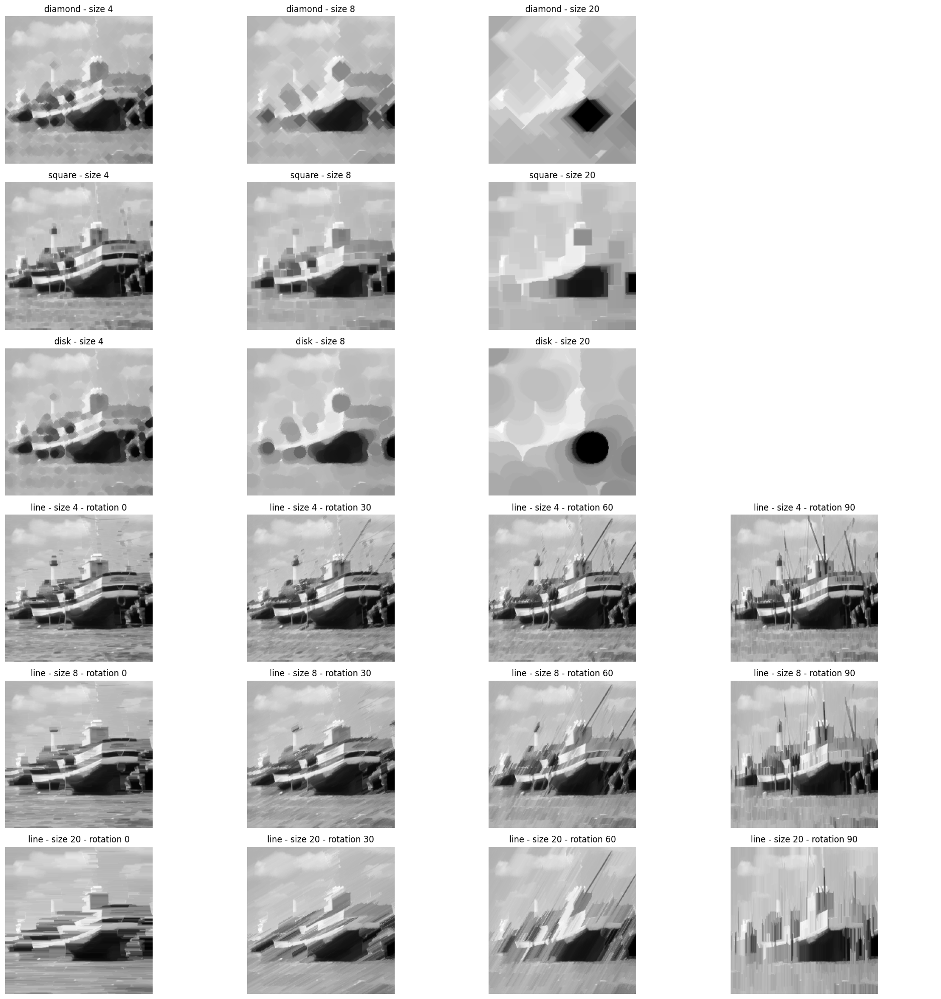

In [60]:
##angelo
#closing

# Define the subplot layout
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

# Define structuring element sizes
size_SE = {0: 4, 1: 8, 2: 20}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

# Define shapes
shapes = ['diamond', 'square', 'disk', 'line']

# Initialize dictionaries to hold structuring elements and plots
se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.closing(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the closing operation and store the result
      result = morpho.closing(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')  # Turn off axis for better visualization

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



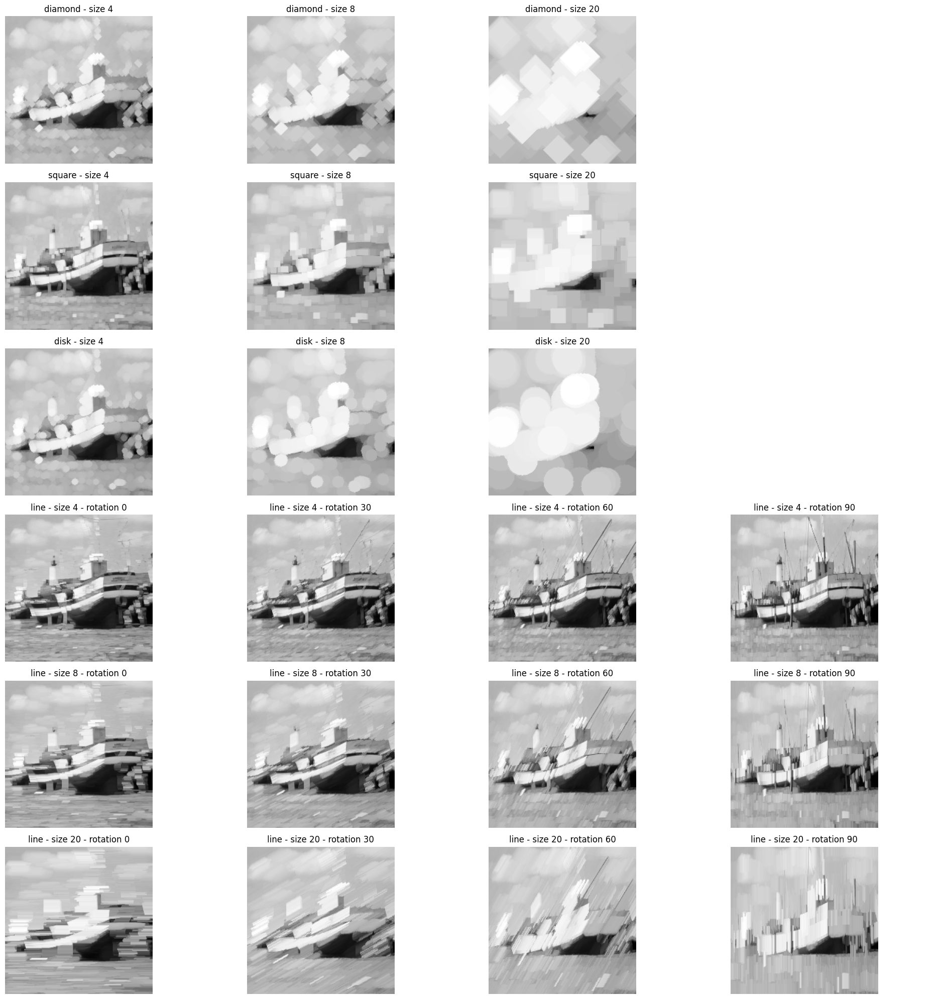

In [61]:
##angelo
#dilation

# Define the subplot layout
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

# Define structuring element sizes
size_SE = {0: 4, 1: 8, 2: 20}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

# Define shapes
shapes = ['diamond', 'square', 'disk', 'line']

# Initialize dictionaries to hold structuring elements and plots
se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.dilation(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the opening operation and store the result
      result = morpho.dilation(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')  # Turn off axis for better visualization

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



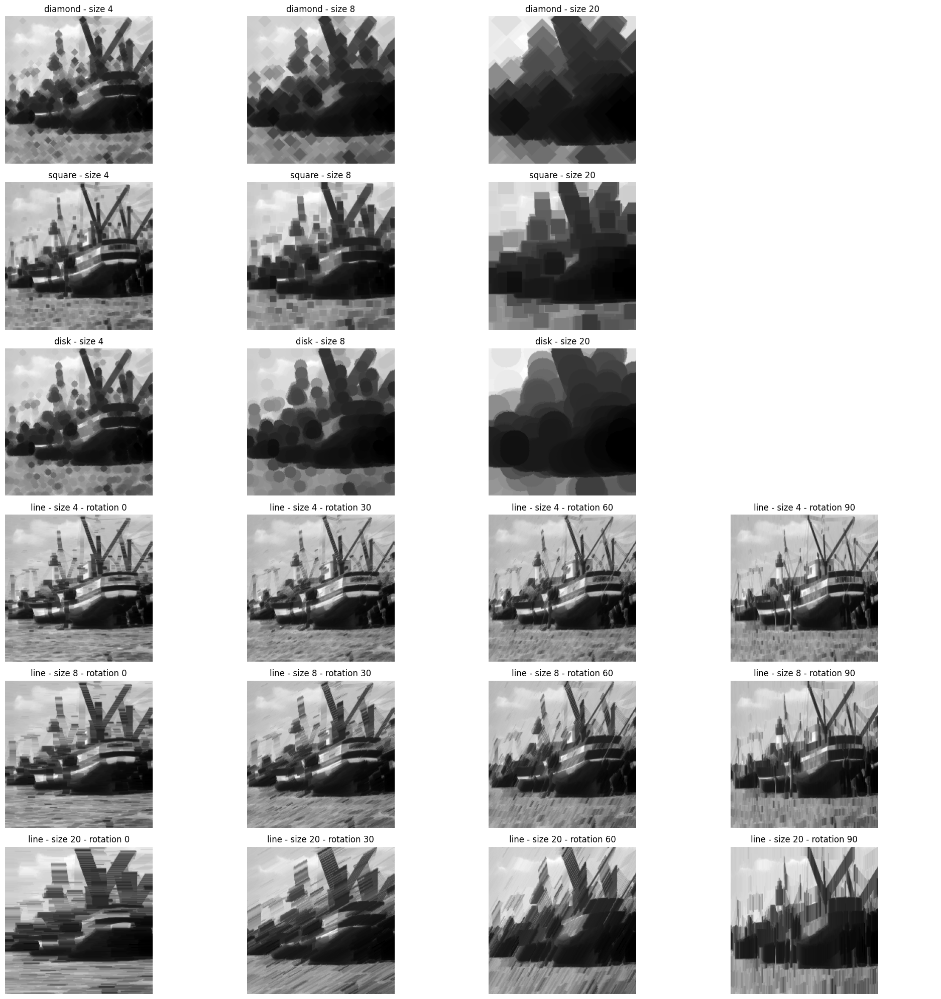

In [62]:
##angelo
#erosion

# Define the subplot layout
fig, axs = plt.subplots(6, 4, figsize=(20, 20))

# Define structuring element sizes
size_SE = {0: 4, 1: 8, 2: 20}
rotation_line_SE = {0: 0, 1: 30, 2: 60, 3: 90}

# Define shapes
shapes = ['diamond', 'square', 'disk', 'line']

# Initialize dictionaries to hold structuring elements and plots
se_dict = {}
plot_dict = {}

for shape_idx, shape in enumerate(shapes):
  for size_idx in range(0,3):
    size = size_SE[size_idx]  # Rotate through size_SE based on shape index

    if shape == 'line':
      for rotation_idx in range(0,4):
        rotation = rotation_line_SE[rotation_idx]
        se_dict[shape] = strel(shape, size, rotation)
        result = morpho.erosion(im, se_dict[shape])

        ax = axs[shape_idx + size_idx, rotation_idx]
        ax.imshow(result, cmap='gray')
        ax.set_title(f'{shape} - size {size} - rotation {rotation}')
        ax.axis('off')
        plot_dict[shape] = result
    else:

      # Create and store structuring element in dictionary
      se_dict[shape] = strel(shape, size)

      # Perform the erosion operation and store the result
      result = morpho.erosion(im, se_dict[shape])

      # Plot the result in one of the subplots
      ax = axs[shape_idx, size_idx]  # Determine subplot location (row, column)
      ax.imshow(result, cmap='gray')  # Display result as grayscale image
      ax.set_title(f'{shape} - size {size}')
      ax.axis('off')  # Turn off axis for better visualization

      # Store the plot in the dictionary
      plot_dict[shape] = result


for i in range(0,3):
  axs[i, 3].axis('off')

# Show all plots
plt.tight_layout()
plt.show()



3. What is the operation equivalent to the succession of a dilation by a square of size 3×3 and a dilation by a square of size 5 × 5? Same question for opening. What are the properties of these operations that explain the result?

(0.0, 1.0, 0.0, 1.0)

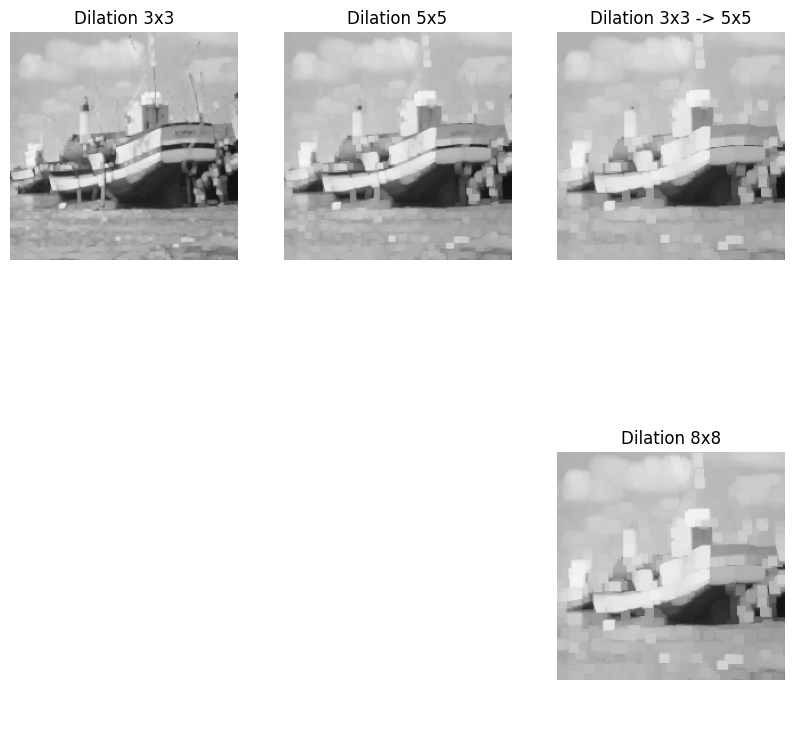

In [63]:
#Applying dilation with square 3x3
se = strel('square', 3)
plot=morpho.dilation(im,se)

#applying dilation with square 5x5
se = strel('square', 5)
plt2 = morpho.dilation(im, se)

#applying dilation 5x5 after 3x3
plt3 = morpho.dilation(plot, se)

#applyiing dilation 8x8
se = strel('square', 8)
plt4 = morpho.dilation(im, se)

fig, axs = plt.subplots(2, 3, figsize=(10, 10))

axs[0,0].imshow(plot, cmap='gray', vmin=0, vmax=255)
axs[0, 0].set_title('Dilation 3x3')
axs[0,0].axis('off')

axs[0,1].imshow(plt2, cmap='gray', vmin=0, vmax=255)
axs[0, 1].set_title('Dilation 5x5')
axs[0,1].axis('off')

axs[0,2].imshow(plt3, cmap='gray', vmin=0, vmax=255)
axs[0, 2].set_title('Dilation 3x3 -> 5x5')
axs[0,2].axis('off')

axs[1,2].imshow(plt4, cmap='gray', vmin=0, vmax=255)
axs[1, 2].set_title('Dilation 8x8')
axs[1,2].axis('off')

axs[1,0].axis('off')
axs[1,1].axis('off')


(-0.5, 199.5, 199.5, -0.5)

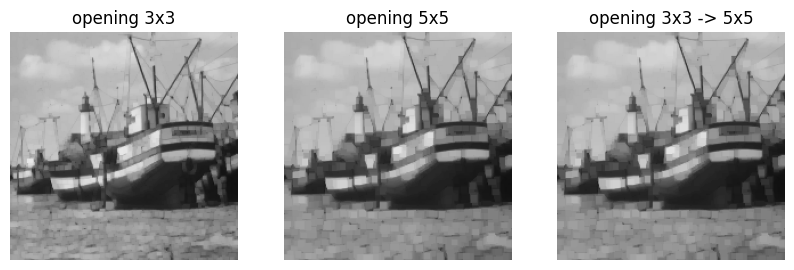

In [64]:
#for the opening
#Applying opening with square 3x3
se = strel('square', 3)
plot=morpho.opening(im,se)

#applying opening with square 5x5
se = strel('square', 5)
plt2 = morpho.opening(im, se)

#applying opening 5x5 after 3x3
plt3 = morpho.opening(plot, se)

fig, axs = plt.subplots(1, 3, figsize=(10, 10))

axs[0].imshow(plot, cmap='gray', vmin=0, vmax=255)
axs[0].set_title('opening 3x3')
axs[0].axis('off')

axs[1].imshow(plt2, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('opening 5x5')
axs[1].axis('off')

axs[2].imshow(plt3, cmap='gray', vmin=0, vmax=255)
axs[2].set_title('opening 3x3 -> 5x5')
axs[2].axis('off')


4. Apply a top-hat transform (difference of the original image and its opening), for instance on image retina2.gif. Comment the result, according to the size and shape of the structuring element. What would be the dual operation (that you can illustrate on image laiton.bmp)?

The top-hat tranform is a morrphological operation that highlights small brights structtures in an image. It is defined as the difference between the original image and its opening by a structuring element.

The opening operation is essentially an erosion followed by dilation, which removes objects thatt are smaller than the structuring element.

__Observations__
1. __Before the top-hat transform:
  
  The first image shows the original grayscale image. t has many small brright structures such as vessels or nerves spread across the image.
2. After ttop-hat of size 5:

  Since the structuring elementt is small, only the smallest bright details. are. subtracted, so we can notice that the finer structures remain highlighted. Larger objects or regions are removed, leaving only small parts of the image.
3. After top-hat of size 10:

  With a size of 10, larger structures are filtererd out. Fewer small objects are highlighted and more details are subtracted compared to size 5.
4. After top-hat of size 30:
  
  By this stage, only much larger structures remain visible. Most of the smaller bright details have been removed. This filter size is effectively removing a lot of the fine structures, showing only the larger vessel structures.
5. After top-hat of size 45:

  With size 45, the structuring element is quite large, so the largest objects are subtracted. Only very few large-scale feattures or vessels remain visible. Small bright objects have been mostly removed, leaving just the largest features.

We can also notice some white regions on the edges are due to *border effects*. These effects occur because of how the morphological operations, such as opening and dilattion, interact with the boundatties of the image. This happens because the chosen structuring element for the opening operation cannot fully fit within the borders of the image. When the structuring element rreaches the edge, it extends beyond the image, leading to incokmplete processing of the boundary pixels. This incokmplete processing manifests as large differences between the original image and the opened one, which are especially visible in the top-hat transform results, where these differences appear as bright or white rregions along the edges.

In particular, as the size of the structuring element increases the problem becomes more pronounced. The larger the structuring element, the more it extends beyond the image boundaries, and the more significantt the effect on the pixels at the edges.

Essentially the operattion behaves differenttly nearr tthe edges because the structurring element isn't able tto intteract with much image data as itt would iin the central parts of the image. As a result, the difference between the original image and the processes image becomes larger near the edges, leading to bright or exaggerated results at those boundaries.

One way to mitigatte this issue is to "pad" the image before applying morphologicsal operations. Padding adds in fact extra space around tthe image, so tthe structuring elementt has room to operate even near the edges without falling. outside the image's boundaries. This way, the morphological operations can be applied uniformly across the entire image, including tthe border areas.

Following the original code, the code using padding.

The dual operation of the top-hat is. called black-hat transform. While the top-hat transform extracts small bright regions, the black-hat transform extracts small dark regions. It is defined as the difference between the closiing of an image and the original image.

##Black hatt##
###Before black hat###
The first image shows the original grayscale image. The image contains brightt, well-defined structures or boundaries between different regions. There are small darrk regions orr gaps present along these boundaries.

###After black hat###
As the structuring element size increases in the black-hat. tranform, the results progressively emphasize larher dark regions. With a small size of 5, the transform highlights fine, small dark featyres along the boundaries. At size 10, these features become slightly more pronoucned, tthough tthe overall pattern remains similar. By size 30, the foucs shifts to larger dark regions, with the finer details merging into more connected dark areas along the boundaries. Finally, at size 45, the largest dark gaps are emphasized, while smaller features are filterred out, resulting in a clearer docus on the broader darrk regions within the image.

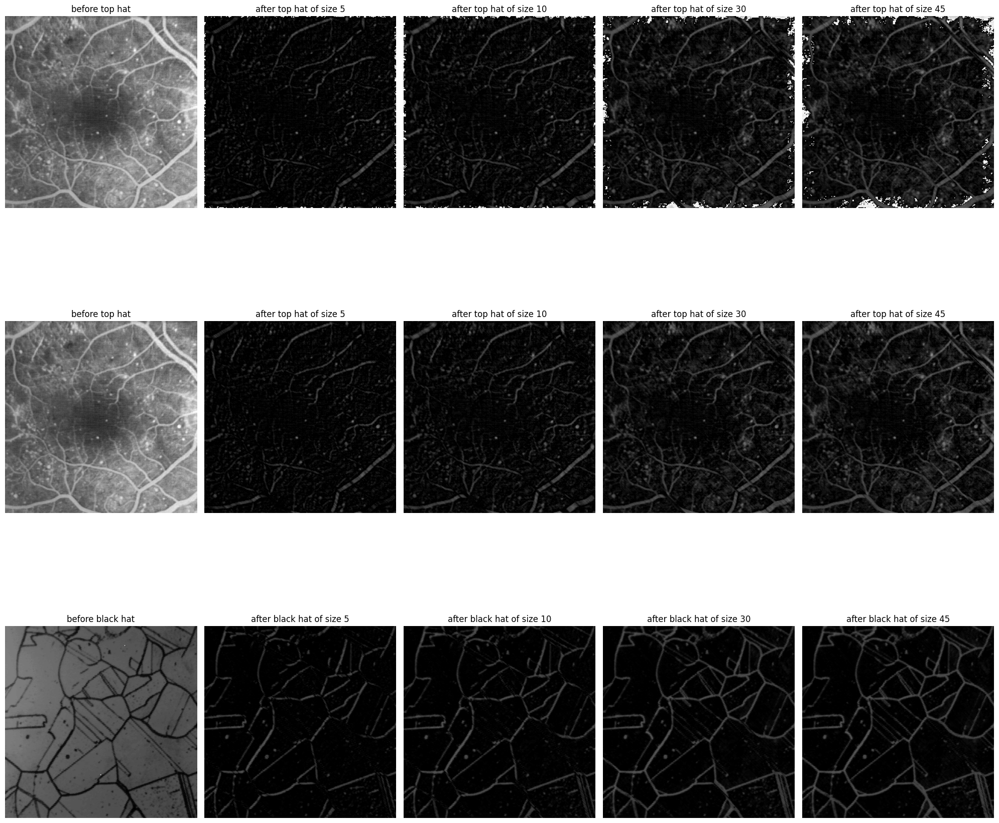

In [65]:
##top hat transform
fig, axs = plt.subplots(3,5, figsize=(20, 20))
im=skio.imread('retina2.gif')
im = np.squeeze(im)
axs[0, 0].imshow(im, cmap = 'gray', vmin = 0, vmax = 255)
axs[0, 0].set_title('before top hat')
axs[0, 0].axis('off')

se_dict = {}
i = 1

#after rtop hat
for t in (5,10,30,45):

  se_dict[t]=strel('line',t,-45)
  ch=im-morpho.opening(im,se_dict[t])
  axs[0, i].imshow(ch, cmap = 'gray', vmin = 0, vmax = 255)
  axs[0, i].set_title(f'after top hat of size {t}')
  axs[0, i].axis('off')
  i += 1

##using padding
# Show original image
axs[1, 0].imshow(im, cmap='gray', vmin=0, vmax=255)
axs[1, 0].set_title('before top hat')
axs[1, 0].axis('off')

# Initialize dictionary for structuring elements
se_dict = {}
i = 1

# Define padding size (should be at least as large as the largest structuring element)
pad_size = 45  # Padding equal to the largest structuring element size

# Pad the image using 'reflect' mode to reduce edge artifacts
padded_im = np.pad(im, pad_width=pad_size, mode='reflect')

# After top-hat with different structuring element sizes
for t in (5, 10, 30, 45):
    # Create structuring element
    se_dict[t] = strel('line', t, -45)

    # Apply opening on the padded image
    opened = morpho.opening(padded_im, se_dict[t])

    # Perform top-hat: original padded image - opened image
    ch = padded_im - opened

    # Crop the result back to the original image size
    cropped_ch = ch[pad_size:-pad_size, pad_size:-pad_size]

    # Display the result
    axs[1, i].imshow(cropped_ch, cmap='gray', vmin=0, vmax=255)
    axs[1, i].set_title(f'after top hat of size {t}')
    axs[1, i].axis('off')
    i += 1

##black_hat
im_laiton = skio.imread('laiton.bmp')
im_laiton=gris_depuis_couleur(im_laiton)

# Setup figure for black-hat results
axs[2,0].imshow(im_laiton, cmap='gray', vmin=0, vmax=255)
axs[2,0].set_title('before black hat')
axs[2,0].axis('off')

# Perform black-hat transform for different structuring element sizes
se_dict_black = {}
i = 1
for t in (5, 10, 30, 45):
    se_dict_black[t] = strel('line', t, -45)  # Adjust structuring element shape and size
    black_hat = morpho.closing(im_laiton, se_dict_black[t]) - im_laiton  # Black-hat operation
    axs[2,i].imshow(black_hat, cmap='gray', vmin=0, vmax=255)
    axs[2,i].set_title(f'after black hat of size {t}')
    axs[2,i].axis('off')
    i += 1

plt.tight_layout()
plt.show()




5. Define segments in several directions, apply an opening with each of them as structuring element, and compute the point-wise maximum of the results. Conclusion?

In [66]:
se_dict = {}

i=0
# After top-hat with different structuring element sizes
for t in (0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 300):
    # Create structuring element
    se_dict[t] = strel('line', 5, t)

    opened = morpho.opening(padded_im, se_dict[t])
    axs[0, i].imshow(cropped_ch, cmap='gray', vmin=0, vmax=255)
    axs[0, i].set_title(f'after top hat of size {t}')
    axs[0, i].axis('off')
    i += 1

IndexError: index 5 is out of bounds for axis 1 with size 5

## 4. Alternate Sequential Filters

I implemented an alternate sequential filering using morphological operations basecally an opening followed by a closing.
The part of filtering started with the orginal image im, where in the first part after the opening we apply a closing using se1. This part is usefull for remove small noise while closing fills with small gaps. You then apply the same process to the result (fas1), but using in this case se2, continuing this pattern for the subsequent structuring element.
For the fase of fas4 and fas5 we repeated the operations with s3 again, which demonstrate how multiple application can reinforce the image.

Considerations:

if the sequence continue to progress, with larger elements, the filtering effect becames more pronunced.
Initially, small details and noise


In [67]:
#different images and names
disk = ['cailloux.png', 'cailloux2.png', 'bat200.bmp', 'bulles.bmp', 'laiton.bmp', 'retina2.gif']
#different images and names
image_filenames = ['cailloux.png', 'cailloux2.png', 'bat200.bmp', 'bulles.bmp', 'laiton.bmp', 'retina2.gif']
se1=strel("disk",1)
se2=strel("disk",2)
se3=strel("disk",3)
se4=strel("disk",4)
se5=strel("disk",5)

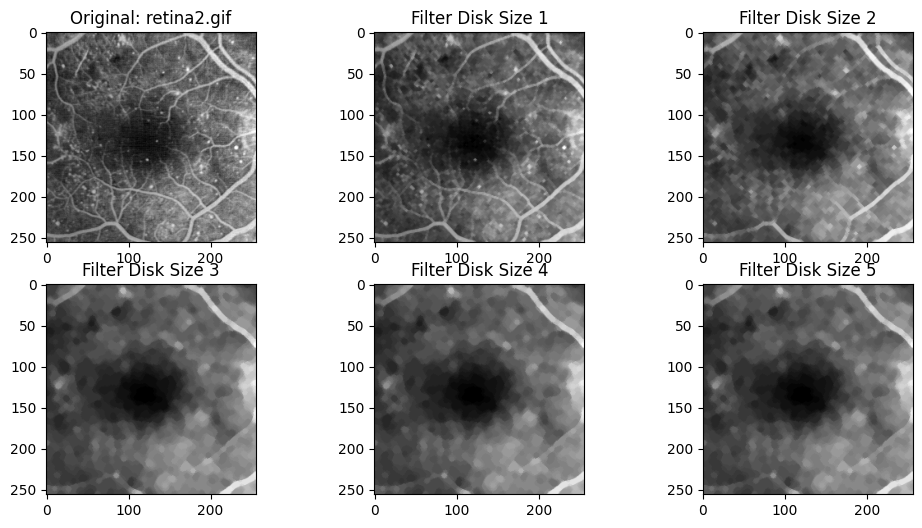

In [68]:
# Loop through each image and apply the filter
for filename in image_filenames:
    im = skio.imread(filename)
    im = np.squeeze(im)  # Remove any unnecessary dimensions
fas1=morpho.closing(morpho.opening(im,se1), se1)
fas2=morpho.closing(morpho.opening(fas1,se2), se2)
fas3=morpho.closing(morpho.opening(fas2,se3), se3)
fas4=morpho.closing(morpho.opening(fas3,se3), se3)
fas5=morpho.closing(morpho.opening(fas4,se3), se3)
plt.figure(figsize=(12, 6))   #plotting
plt.subplot(231), plt.imshow(im, cmap="gray"), plt.title(f'Original: {filename}')
plt.subplot(232), plt.imshow(fas1, cmap="gray"), plt.title('Filter Disk Size 1')
plt.subplot(233), plt.imshow(fas2, cmap="gray"), plt.title('Filter Disk Size 2')
plt.subplot(234), plt.imshow(fas3, cmap="gray"), plt.title('Filter Disk Size 3')
plt.subplot(235), plt.imshow(fas4, cmap="gray"), plt.title('Filter Disk Size 4')
plt.subplot(236), plt.imshow(fas5, cmap="gray"), plt.title('Filter Disk Size 5')
plt.show()

## 5.1 Morphological Reconstruction ##

We applied **reconstruction by dilation** to an image after performing an **opening operation**. The opening operation aims to remove small noise and details from the image, leaving behind only the larger structures. However, this could cause some important features to be removed.

In this case, we first performed an opening operation with `open4 = morpho.opening(im, se4)`. Then, we applied **dilation** using `reco = morpho.reconstruction(open4, im)`. This step is important because it restores the smaller details that could have been removed by the opening operation.


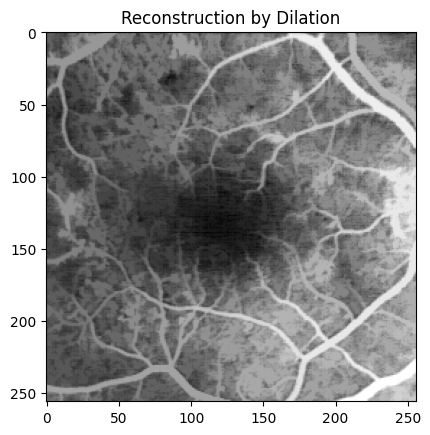

In [94]:
im = skio.imread("retina2.gif")
if im.ndim == 3 and im.shape[-1] == 3: #greyscale convesion
    im = rgb2gray(im)
im = np.squeeze(im)
se4 = morpho.disk(4)
open4 = morpho.opening(im, se4)   #opening
reco = morpho.reconstruction(open4, im)     #dilatation
plt.imshow(reco, cmap="gray")   #visualisation
plt.title("Reconstruction by Dilation")
plt.show()

## 5.2 Morphological Reconstruction by Erosion ##

In this step, we implemented **reconstruction by erosion**, which works in the opposite direction to reconstruction by dilation. Erosion shrinks the structures in the image, progressively removing small details while preserving larger ones within the boundaries of the mask image.

We first performed an erosion operation using `ero4 = morpho.erosion(im, se4)` with a disk-shaped structuring element. Then, we applied **reconstruction by erosion** with `reco_erosion = morpho.reconstruction(im, ero4, method='erosion')`. This allowed us to restore important structures that were partially removed by the erosion.

### Duality Principle

Using the **duality principle**, reconstruction by erosion can be derived from **reconstruction by dilation**. The duality principle states that by **inverting** the image and performing reconstruction by dilation on the inverted image, we achieve the same effect as performing reconstruction by erosion on the original image. This principle shows the complementary nature of dilation and erosion: what dilation adds, erosion removes, and vice versa.


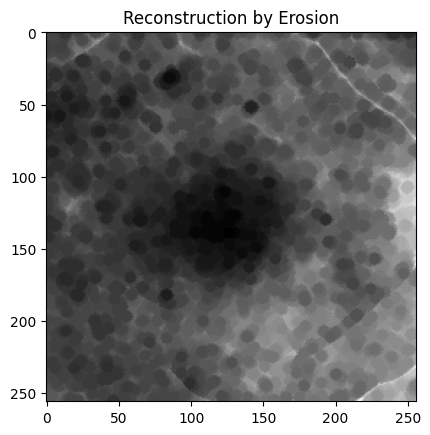

In [99]:
# Erosion operation with the same structuring element (disk of size 4)
ero4 = morpho.erosion(im, se4)
# Reconstruction by erosion
reco_erosion = morpho.reconstruction(im, ero4, method='erosion')
# Display the result of reconstruction by erosion
plt.imshow(reco_erosion, cmap="gray")
plt.title("Reconstruction by Erosion")
plt.show()


## 5.3 Alternate Sequential Filter with Reconstruction ##

In this step, we applied an **alternate sequential filter**, where each stage alternates between opening and closing operations on the image. To make the process more robust, we introduced a morphological reconstruction after each operation.

After the opening, which removes noise and smaller details, we performed a **reconstruction by dilation**. This step is crucial because it restores the finer details that might have been removed during the opening operation. Following that, we applied a closing operation to remove small gaps or holes in the image, and then carried out a **reconstruction by erosion**. This final phase helps preserve the larger structures, ensuring that the key information in the image remains intact.

The overall result of this process is a more effectively filtered image, where important details are either preserved or restored, while noise and unnecessary small features are removed.


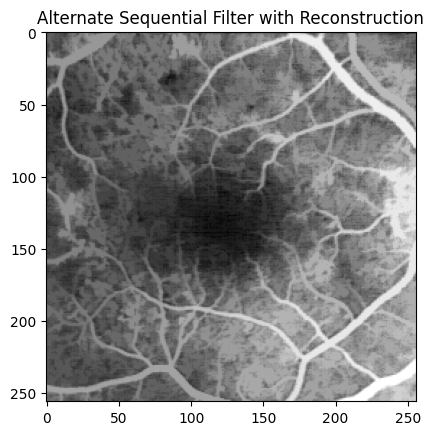

In [98]:
#opening followed by reconstruction by dilation
fas1 = morpho.closing(morpho.opening(im, se4), se4)
fas1 = np.minimum(fas1, im)# Ensure the seed image (fas1) does not exceed the mask image (im)
reco1_dil = morpho.reconstruction(fas1, im)   #reconstructing by dilation

# Step 2: Clamp values to ensure that the seed image (reco1_dil) does not exceed the mask image (im)
reco1_dil = np.minimum(reco1_dil, im)
reco1_ero = morpho.reconstruction(im, reco1_dil, method='erosion')# Perform reconstruction by erosion after closing

#result
plt.imshow(reco1_ero, cmap="gray")
plt.title("Alternate Sequential Filter with Reconstruction")
plt.show()


## 6. Segmentation and Watershed Algorithm


1. Compute the morphological gradient (dilation - erosion with an elementary structuring element, of size 1), for instance on image bat200.bmp. Comment the results.

The morphological gradient emphasize the edges or boundaries of structures within the image, as we can see from the resulting image below. The. dilation expands bright areas, while the erosion. reduces them. The gradient hence highlights tthe regions where these operations differ the most, which typically corresponds to edges. or transitions between light and dark regions in the image.

As we can observe from the result the edges and contours of the boats. and structure. are clearly highlighted. This is because the morphologival gradient captures the variations in intensity between adjacent pixels, parrticularly at object boundaries where there is a significant change in intensity. The finer details of the image, such as. the rigging on the boats and other small structures, are well-defined. These details correspond to areas where the intensity changes rapidly, and the morphological gradient makes them stand out against the background. The background areas with relatively uniform intesity, such as the sky and water, are largely suppressed. These areas do not have significant intensity transitions, so the gradient operation has little effect there.

As we can. easily. understand from the result, the morphological gradient. is a. powerful ttol for edge detecttion. It effectively highlights. boundaries. and transitions between different regions of intensity in the image, making it useful forr identifying. object. ouytlines and emphasizing the structural details of the image. In tthis case, the gradietn has enhanced the edges of the boats and other elemnts in the scene, giving a clearer representation of the image's imain features. However, some noise or minor details in the background may also appear, as the gradient can accentuate small variations in intensity.

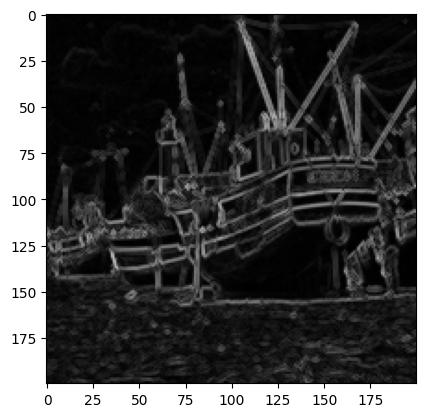

In [75]:
im=skio.imread('bat200.bmp')
im=gris_depuis_couleur(im)
se=strel('disk',1)
dil=morpho.dilation(im,se)
ero=morpho.erosion(im,se)

grad = dil - ero
plt.imshow(grad,cmap="gray",vmin=0, vmax=255)


2. Compute the watershed on this gradient image (see the corresponding section in the code).
Comment the results. For the visualization, the watershed lines (having value 0 in the result) can be superimposed on the original image.

In the. resulting image, the watershed lined, which separate different. regions or segments, are superimposed on the original. image and. are visualized. as the white. contours.

The watershed algorithm is a region-based segmentation method that treats the. image. like. a topographic surface where high-intensity areas represent ridges and low-intensity areas represent valleys. The wateshed lines (the white contours) represent the boundaries between differrent. regions or "basins" formed by the segmentation process.

In our image the. watershed lines are placed at the boundaries of distinct regions, particularly around the. edges of the boats and other elements in the scene. These boundaries correspond to areas where there. are significant intensity transitions, as detected by the morphological gradient.

The result shows the segmentation boundaries overlaid on the original image. These boundaries. follow the edges of objects like the boats, masts and other structures quite well, highlighting the contours of different parts of the scene.

However the segmentation might also pick up on small variations in texture or noise, resulting in over-segmentation in some areas. For example, we can see some small, scattered boundaries wehre there may not be meaningful. objects. in the image.

The watershed. algorithm can also sometimes be. sensitive to small variiations in the gradient. This is visible in the fine, small contours scattered. across the image, especially in areas with textures. or slight intensity variations. This could be mitigated by applying some form of pre-processing, such as smoothing the. image. or using markers. to guide the watershed. segmentation.

In conclusion the watershed algorithm applied here has successfully identified and outlined many of the prominent objects. and structures in the image, especially. around the boats. However., the result also includes small and potentially insignificant boundaries. due to sensitivyu. to nois.e or minor variations. in the gradient. This is a typical behavior of watershed segmentation when applied without. specific markers, leading to. over-segmentation in some cases. To refine. the. result, one. could consider pre-processing the. image to reduce noise or using. marker-based. watershed segmentation, where. manually or automattically defined. markers help guide the. segmenation process. more effectively.



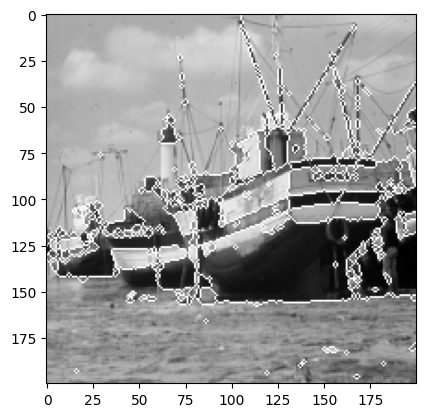

In [76]:
grad=np.int32(grad>40)*grad
plt.imshow(grad,cmap="gray")

local_mini = skf.peak_local_max(255-grad)
mask = np.zeros(im.shape, dtype=bool)
mask[tuple(local_mini.T)] = True
markers, _ = ndi.label(mask)
plt.imshow(mask,cmap="gray")

labels = watershed(grad, markers, mask=im, watershed_line=True)
#labels = watershed(grad, markers,watershed_line=True)
plt.imshow(couleurs_alea(labels))
# viewimage_color(couleurs_alea(labels)) - Utilisable si gimp est installé

# visualization of the result
segm=labels.copy()
for i in range(segm.shape[0]):
    for j in range(segm.shape[1]):
        if segm[i,j] == 0:
            segm[i,j]=255
        else:
            segm[i,j]=0
#superimposition of segmentation contours on the original image
contourSup=np.maximum(segm,im)
plt.imshow(contourSup,cmap="gray")

3. Try to improve the result by filtering the original image by an appropriate morphological filter and/or by filtering the gradient image by a closing, before computing the watersheds

AttributeError: module 'skimage.morphology' has no attribute 'selem'

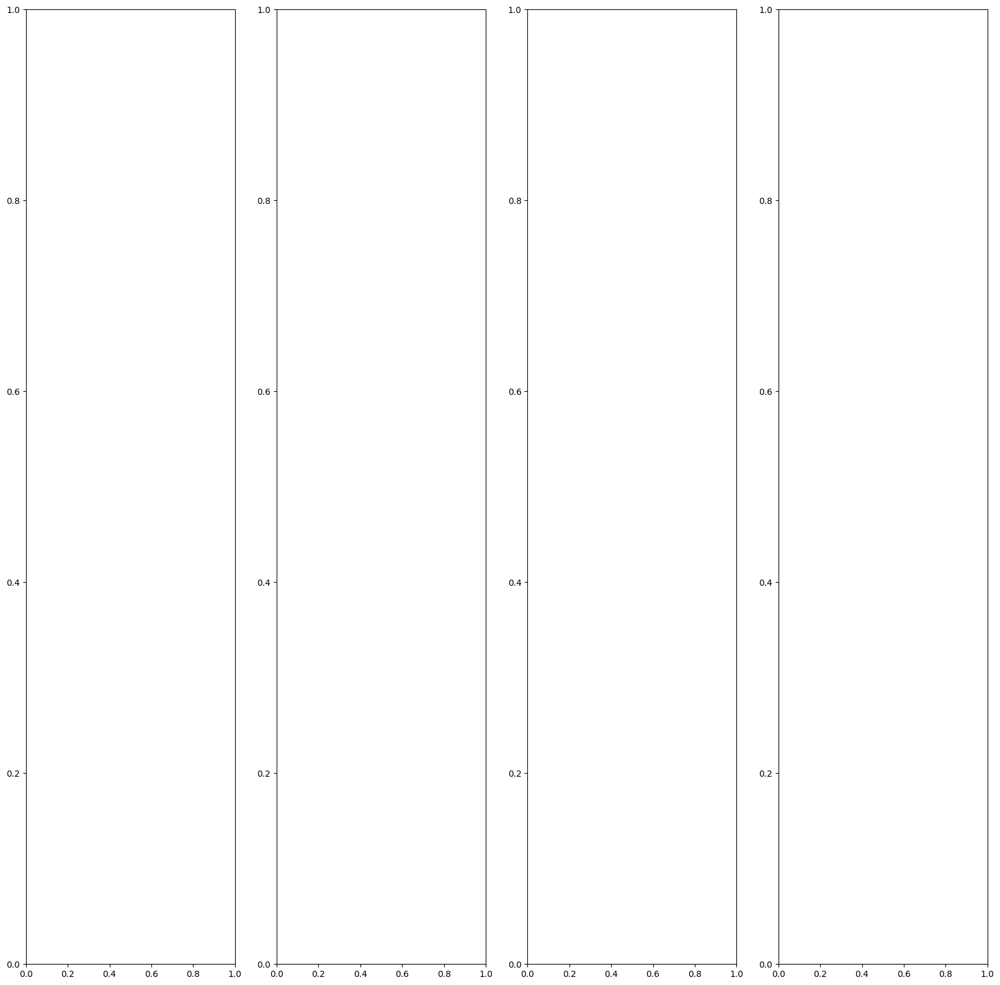

In [71]:
fig, axs = plt.subplots(1,4, figsize=(20, 20))

se = strel('disk', 40)
clos=morpho.closing(grad,se)
grad3=np.int32(grad>40)*clos
#plt.imshow(grad3,cmap="gray")

local_mini2 = skf.peak_local_max(255-grad3)
mask2 = np.zeros(im.shape, dtype=bool)
mask2[tuple(local_mini2.T)] = True
markers2, _ = ndi.label(mask2)
#plt.imshow(mask,cmap="gray")

labels2 = watershed(grad3, markers2, mask=im, watershed_line=True)
#labels = watershed(grad, markers,watershed_line=True)
#plt.imshow(couleurs_alea(labels2))
# viewimage_color(couleurs_alea(labels)) - Utilisable si gimp est installé

# visualization of the result
segm2=labels2.copy()
for i in range(segm2.shape[0]):
    for j in range(segm2.shape[1]):
        if segm2[i,j] == 0:
            segm2[i,j]=255
        else:
            segm2[i,j]=0
#superimposition of segmentation contours on the original image
contourSup2=np.maximum(segm2,im)
axs[0].imshow(contourSup, cmap='gray', vmin=0, vmax=255)
axs[0].set_title('original waterhsed')
axs[0].axis('off')

axs[1].imshow(contourSup2, cmap='gray', vmin=0, vmax=255)
axs[1].set_title('waterhsed after closing')
axs[1].axis('off')

axs[2].imshow(grad, cmap='gray', vmin=0, vmax=255)
axs[2].set_title('waterhsed after closing')
axs[2].axis('off')

axs[3].imshow(clos, cmap='gray', vmin=0, vmax=255)
axs[3].set_title('waterhsed after closing')
axs[3].axis('off')

## 7. Conclusion